<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB
None
   fips  TOT_POP    0-9  0-9 y/o % of total pop  19-Oct  \
0  1001    55601   6787               12.206615    7637   
1  1003   218022  24757               11.355276   26913   
2  1005    24881   2732               10.980266    2960   
3  1007    22400   2456               10.964286    2596   
4  1009    57840   7095               12.266598    7570   

   10-19 y/o % of total pop  20-29  20-29 y/o % of total pop  30-39  \
0                 13.735364   6878                 12.370281   7089   
1                 12.344167  23579                 10.814964  25213   
2                 11.896628   3268                 13.134520   3201   
3                 11.589286   3029                 13.522321   3113   
4                 13.087828   6742                 11.656293   6884   

   30-39 y/o % of total pop 

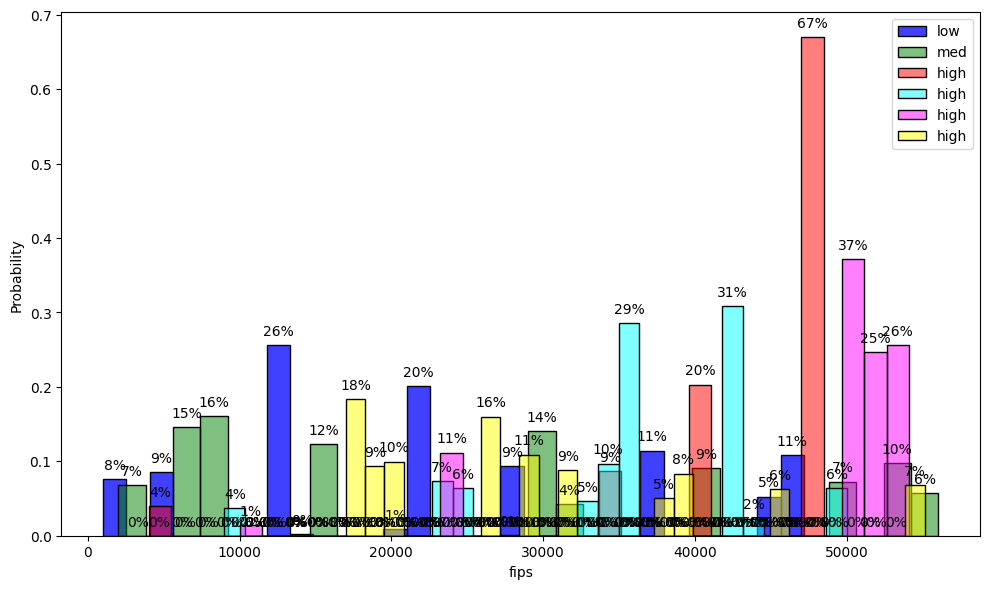

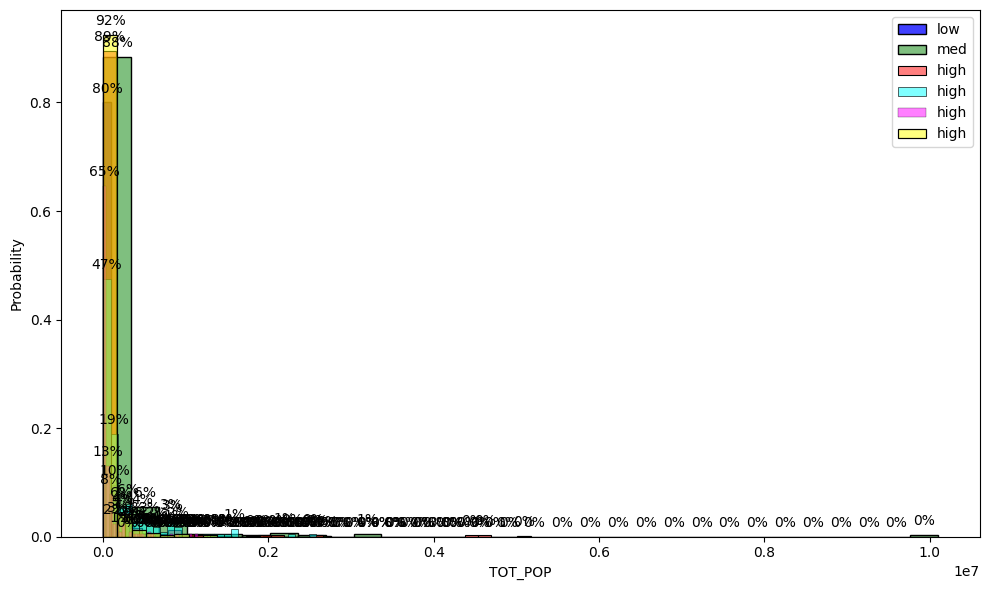

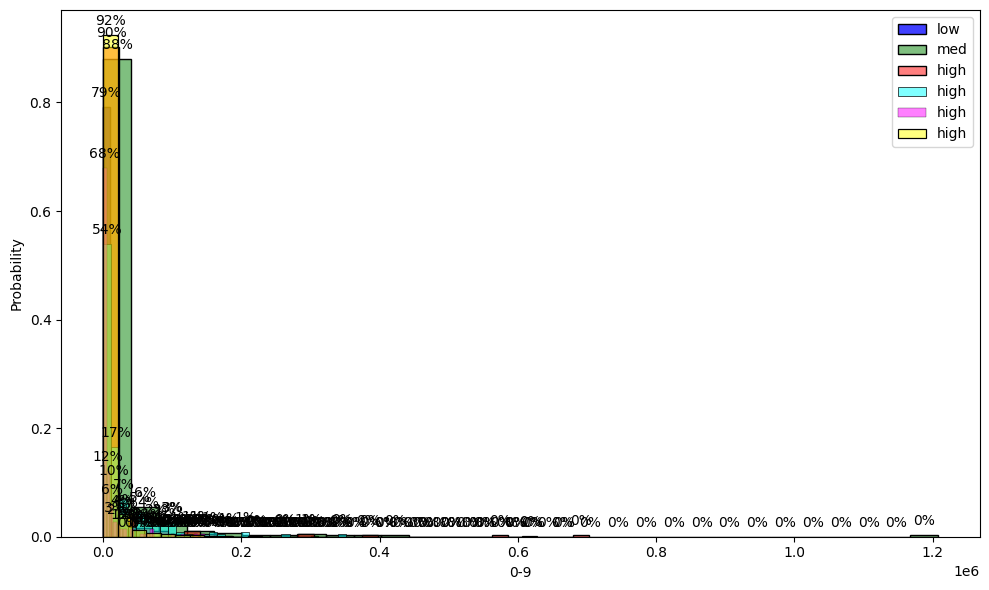

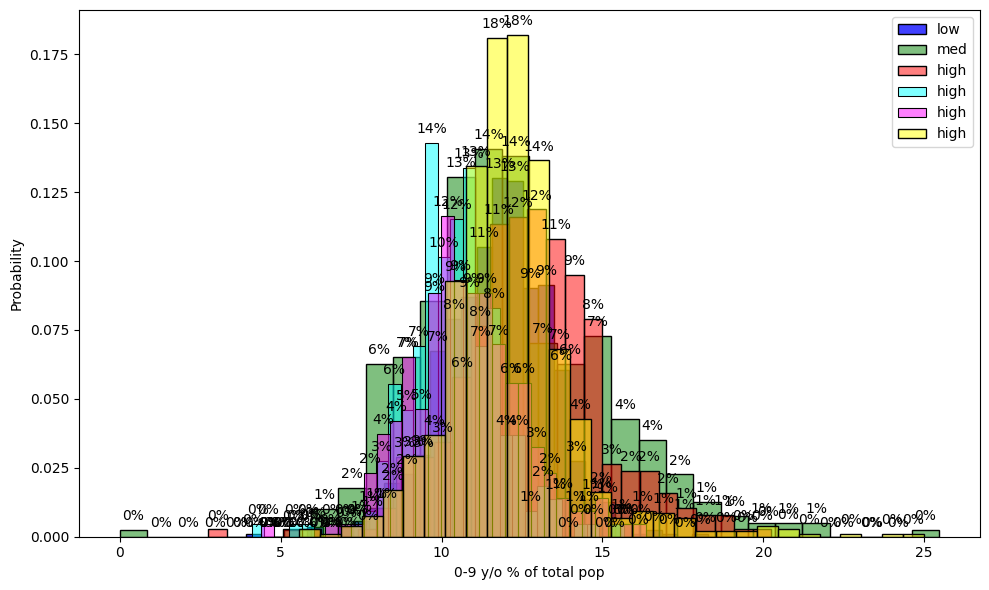

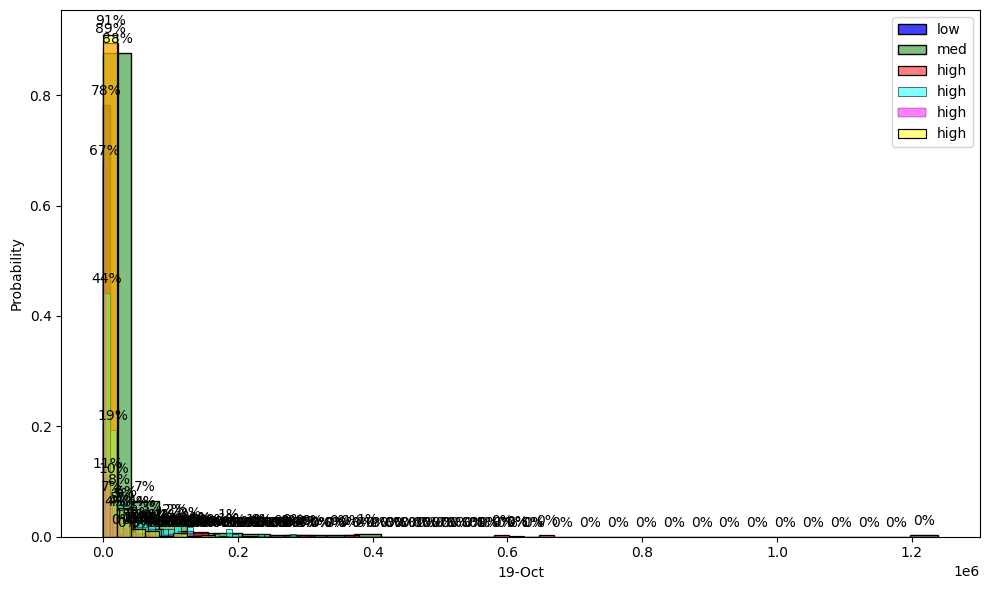

...

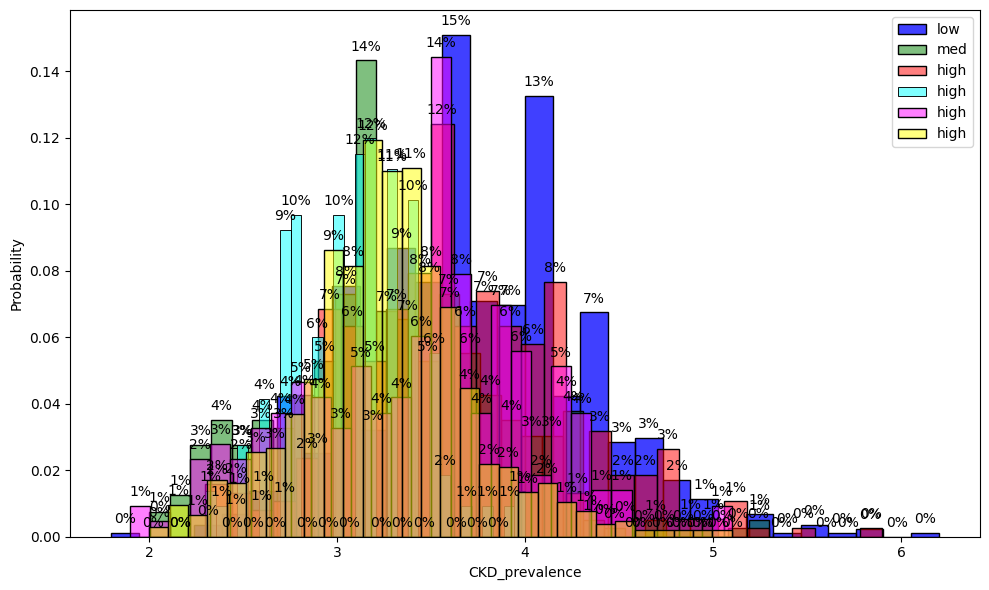

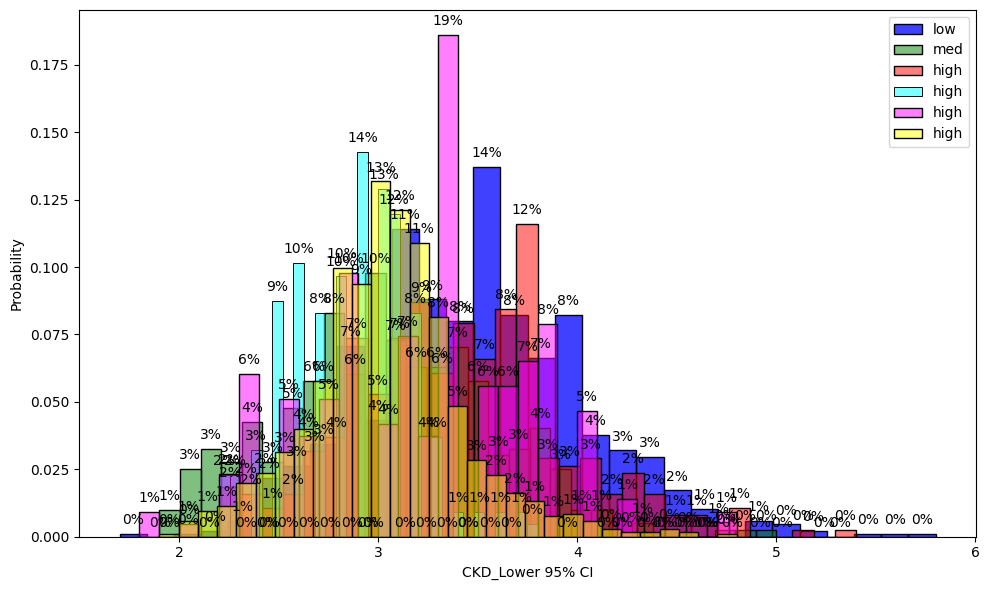

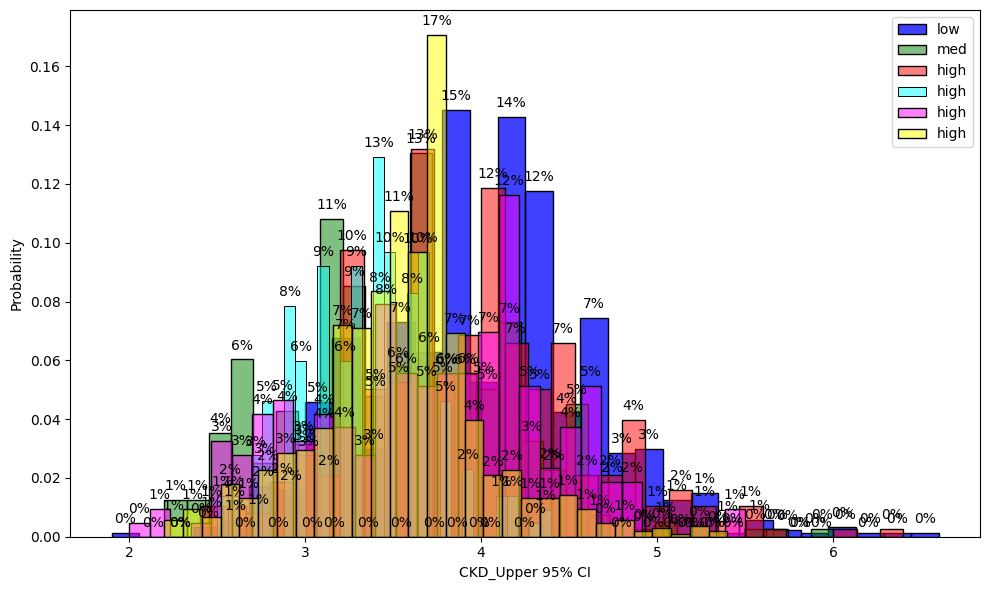

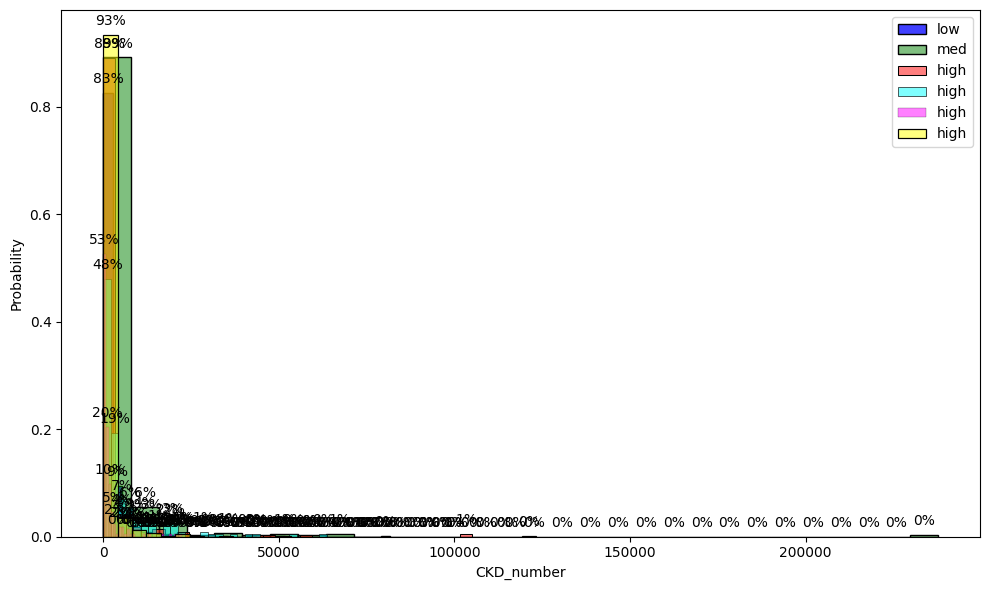

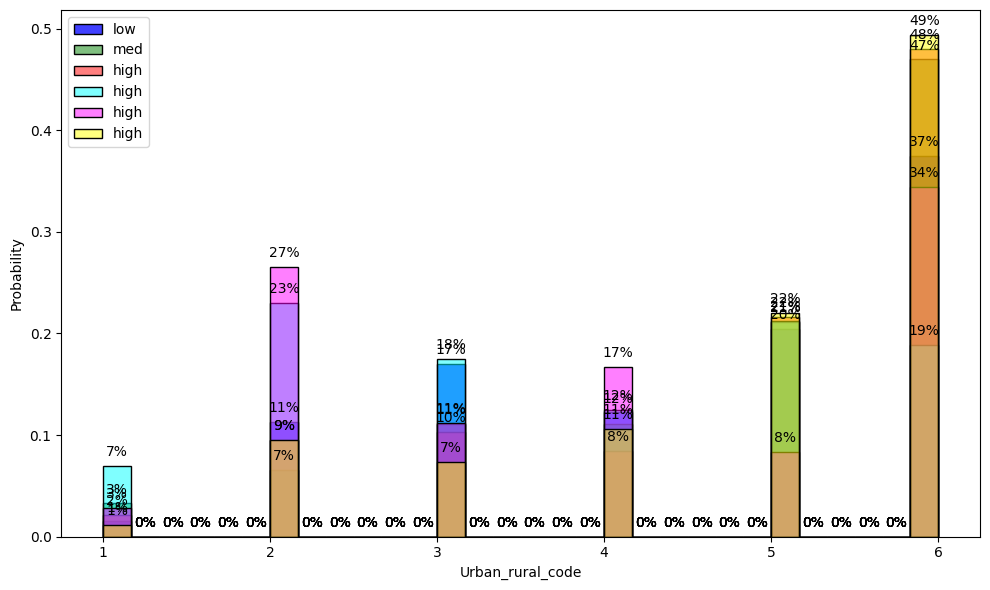

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import statsmodels.api as sm
from patsy import dmatrices
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error, r2_score

# State problem
'''Problem Statement: 
Sociodemographic and health resource data have been collected by county in the United States and 
we want to find out if there is any relationship between health resources and sociodemographic data.\n'''

# Feature,,
# fips,FIPS Code for the County,

# TOT_POP,Total Population,This data as well as all Age and Race data is pulled from the 2019 Population Estimates of the US Census

# 0-9,Population aged 0-9,All of the other age columns are the same but with varying age
# 0-9 y/o % of total pop,% of the population aged 0-9,
# 10-19',,
# 10-19 y/o % of total pop,,
# 20-29,,
# 20-29 y/o % of total pop,,
# 30-39,,
# 30-39 y/o % of total pop,,
# 40-49,,
# 40-49 y/o % of total pop,,
# 50-59,,
# 50-59 y/o % of total pop,,
# 60-69,,
# 60-69 y/o % of total pop,,
# 70-79,,
# 70-79 y/o % of total pop,,
# 80+,,
# 80+ y/o % of total pop,,

# White-alone pop,Population that is White only,All of the other age columns are the same but with varying age
# % White-alone,% of population that is White only,
# Black-alone pop,,
# % Black-alone,,
# Native American/American Indian-alone pop,,
# % NA/AI-alone,,
# Asian-alone pop,,
# % Asian-alone,,
# Hawaiian/Pacific Islander-alone pop,,
# % Hawaiian/PI-alone,,
# Two or more races pop,,
# % Two or more races,,

# N_POP_CHG_2018,Numeric Change in resident total population 7/1/2017 to 7/1/2018,
# GQ_ESTIMATES_2018,7/1/2018 Group Quarters total population estimate,
# R_birth_2018,Birth rate in period 7/1/2017 to 6/30/2018,
# R_death_2018,Death rate in period 7/1/2017 to 6/30/2018,
# R_NATURAL_INC_2018,Natural increase rate in period 7/1/2016 to 6/30/2017,
# R_INTERNATIONAL_MIG_2018,Net international migration rate in period 7/1/2017 to 6/30/2018,
# R_DOMESTIC_MIG_2018,Net domestic migration rate in period 7/1/2017 to 6/30/2018,
# R_NET_MIG_2018,Net migration rate in period 7/1/2017 to 6/30/2018,

# Less than a high school diploma 2014-18,"Education variables are self explanatory, first 4 are number and second 4 are %",
# High school diploma only 2014-18,,
# Some college or associate's degree 2014-18,,
# Bachelor's degree or higher 2014-18,,
# Percent of adults with less than a high school diploma 2014-18,,
# Percent of adults with a high school diploma only 2014-18,,
# Percent of adults completing some college or associate's degree 2014-18,,
# Percent of adults with a bachelor's degree or higher 2014-18,,

# POVALL_2018,Estimate of people of all ages in poverty 2018,
# PCTPOVALL_2018,Estimated percent of people of all ages in poverty 2018,
# PCTPOV017_2018,Estimated percent of people age 0-17 in poverty 2018,
# PCTPOV517_2018,Estimate of related children age 5-17 in families in poverty 2018,
# MEDHHINC_2018,Estimate of median household income 2018,
# CI90LBINC_2018,90% confidence interval lower bound of estimate of median household income 2018,
# CI90UBINC_2018,90% confidence interval upper bound of estimate of median household income 2018,
# Civilian_labor_force_2018,Civilian labor force annual average,
# Employed_2018,Number employed annual average,
# Unemployed_2018,Number unemployed annual average,
# Unemployment_rate_2018,Unemployment rate,
# Med_HH_Income_Percent_of_State_Total_2018,"County Household Median Income as a percent of the State Total Median Household Income, 2018",

# Active Physicians per 100000 Population 2018 (AAMC),"Total Active Patient Care Physicians per 100,000 Population, 2018 (Assumed identical to state)",
# Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),"Active Primary Care Physicians per 100,000 Population, 2018 (Assumed identical to state)",
# Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),"Active Patient Care Primary Care Physicians per 100,000 Population, 2018 (Assumed identical to state)",
# Active General Surgeons per 100000 Population 2018 (AAMC),"Active General Surgeons per 100,000 Population, 2018 (Assumed identical to state)",
# Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),"Active Patient Care General Surgeons per 100,000 Population, 2018 (Assumed identical to state)",
# Total nurse practitioners (2019),Total nurses (2019) (Assumed proportion to fraction of state population living in county,
# Total physician assistants (2019),Total physical assistants (2019) (Assumed proportion to fraction of state population living in county,
# Total Hospitals (2019),Total Hospitals (2019) (Assumed proportion to fraction of state population living in county),
# Internal Medicine Primary Care (2019),Active Internal Medicine Primary Care Physicians (2019) (Assumed proportion to fraction of state population living in county),
# Family Medicine/General Practice Primary Care (2019),Active Family Medicine/General Practice Primary Care Physicians (2019) (Assumed proportion to fraction of state population living in county),
# Total Specialist Physicians (2019),"Sum of Psychiatry, Surgery, Anesthesiology, Emergency Med, Radiology, Cardiology, Oncology, Endocrinology, and Other specialists (2019) (Assumed proportion to fraction of state population living in county",
# ICU Beds_x,Number of ICU beds per county,

# Population Aged 60+,Population aged 60+,All of the other age columns are the same but with varying age
# Percent of Population Aged 60+,% of the population aged 60+,

# STATE_FIPS,FIPS Code for the State,

# county_pop2018_18 and older,Population aged 18+ per county in 2018,

# anycondition_prevalence,A prevalence rate is�the total number of cases of a disease existing in a population divided by the total population.,
# anycondition_Lower 95% CI,CI means confidence interval,
# anycondition_Upper 95% CI,,
# anycondition_number,Population with anycondition,
# Obesity_prevalence,,
# Obesity_Lower 95% CI,,
# Obesity_Upper 95% CI,,
# Obesity_number,Population with Obesity,
# Heart disease_prevalence,,
# Heart disease_Lower 95% CI,,
# Heart disease_Upper 95% CI,,
# Heart disease_number,Population with Heart Disease,
# COPD_prevalence,,
# COPD_Lower 95% CI,,
# COPD_Upper 95% CI,,
# COPD_number,Population with COPD,
# diabetes_prevalence,,
# diabetes_Lower 95% CI,,
# diabetes_Upper 95% CI,,
# diabetes_number,Population with diabetes,
# CKD_prevalence,,
# CKD_Lower 95% CI,,
# CKD_Upper 95% CI,,
# CKD_number,Population with CKD,

# Urban_rural_code,"It distinguishes metropolitan (metro) counties by the population size of their metro area, and nonmetropolitan (nonmetro) counties by degree of urbanization and adjacency to a metro area or areas.�",
# ,Metro counties:,
# ,,
# ,1 (Counties in metro areas of 1 million population or more),
# ,"2 (Counties in metro areas of 250,000 to 1 million population)",
# ,"3 (Counties in metro areas of fewer than 250,000 population)",
# ,,
# ,Nonmetro counties:,
# ,,
# ,"4 (Urban population of 20,000 or more, adjacent to a metro area)",
# ,"5 (Urban population of 20,000 or more, not adjacent to a metro area)",
# ,"6 (Urban population of 2,500 to 19,999, adjacent to a metro area)",
# ,"7 (Urban population of 2,500 to 19,999, not adjacent to a metro area)",
# ,"8 (Completely rural or less than 2,500 urban population, adjacent to a metro area)",
# ,"9 (Completely rural or less than 2,500 urban population, not adjacent to a metro area)",
# ,88 (Unknown-Alaska/Hawaii State/not official USDA Rural-Urban Continuum code),
# ,99 (Unknown/not official USDA Rural-Urban Continuum code),

# Read data
total_data = pd.read_csv('/workspaces/machine-learning-python-template-ds-2023/Ryan/raw/socio_dem.csv')
pd.set_option('display.max_columns', 300)

# See info
print(total_data.info())

# See data
print(total_data.head())

# Add REGION column
region_mapping = {
    'Alabama': 'Southeast',
    'Alaska': 'West',
    'Arizona': 'Southwest',
    'Arkansas': 'Southeast',
    'California': 'West',
    'Colorado': 'West',
    'Connecticut': 'Northeast',
    'Delaware': 'South',
    'Florida': 'Southeast',
    'Georgia': 'Southeast',
    'Hawaii': 'West',
    'Idaho': 'West',
    'Illinois': 'Midwest',
    'Indiana': 'Midwest',
    'Iowa': 'Midwest',
    'Kansas': 'Midwest',
    'Kentucky': 'Southeast',
    'Louisiana': 'Southeast',
    'Maine': 'Northeast',
    'Maryland': 'South',
    'Massachusetts': 'Northeast',
    'Michigan': 'Midwest',
    'Minnesota': 'Midwest',
    'Mississippi': 'Southeast',
    'Missouri': 'Midwest',
    'Montana': 'West',
    'Nebraska': 'Midwest',
    'Nevada': 'West',
    'New Hampshire': 'Northeast',
    'New Jersey': 'Northeast',
    'New Mexico': 'Southwest',
    'New York': 'Northeast',
    'North Carolina': 'Southeast',
    'North Dakota': 'Midwest',
    'Ohio': 'Midwest',
    'Oklahoma': 'Southwest',
    'Oregon': 'West',
    'Pennsylvania': 'Northeast',
    'Rhode Island': 'Northeast',
    'South Carolina': 'Southeast',
    'South Dakota': 'Midwest',
    'Tennessee': 'Southeast',
    'Texas': 'Southwest',
    'Utah': 'West',
    'Vermont': 'Northeast',
    'Virginia': 'South',
    'Washington': 'West',
    'West Virginia': 'South',
    'Wisconsin': 'Midwest',
    'Wyoming': 'West'
}

total_data['REGION'] = total_data['STATE_NAME'].map(region_mapping)

# Categorize columns
numerical_columns = total_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = total_data.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
target = ['COUNTY_NAME', 'STATE_NAME', 'COUNTY_STATE', 'REGION']

# Factorize categorical for EDA
for col in categorical_columns:
    labels, unique_categories = pd.factorize(total_data[col])
    total_data[col + '_encoded'] = labels  # Adding an encoded column
    print(f"Factorization for {col}:")
    for index_r, category_r in enumerate(unique_categories):
        print(f"{category_r}: {index_r}")
    print("\n")

# Check for duplicates
print(f'''Duplicated: {total_data.duplicated().sum()}''')
duplicates = total_data[total_data.duplicated()]
print(duplicates)
total_data.drop_duplicates(inplace=True)

# Southeast: 0
# West: 1
# Southwest: 2
# Northeast: 3
# South: 4
# Midwest: 5

# Filter by region
southeast_data = total_data[total_data['REGION_encoded'] == 0]
west_data = total_data[total_data['REGION_encoded'] == 1]
southwest_data = total_data[total_data['REGION_encoded'] == 2]
northwest_data = total_data[total_data['REGION_encoded'] == 3]
south_data = total_data[total_data['REGION_encoded'] == 4]
midwest_data = total_data[total_data['REGION_encoded'] == 5]


# Plot histograms
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    
    ax = plt.gca()

    # Plot data
    sns.histplot(southeast_data[column], kde=False, stat='probability', label='southeast', bins=30, color='blue', ax=ax)
    sns.histplot(west_data[column], kde=False, stat='probability', label='west', bins=30, color='green', alpha=0.5, ax=ax)
    sns.histplot(southwest_data[column], kde=False, stat='probability', label='southwest', bins=30, color='red', alpha=0.5, ax=ax)
    sns.histplot(northwest_data[column], kde=False, stat='probability', label='northwest', bins=30, color='cyan', alpha=0.5, ax=ax)
    sns.histplot(south_data[column], kde=False, stat='probability', label='south', bins=30, color='magenta', alpha=0.5, ax=ax)
    sns.histplot(midwest_data[column], kde=False, stat='probability', label='midwest', bins=30, color='yellow', alpha=0.5, ax=ax)

    # Getting all the rectangles (bar patches) in the current axes
    patches = ax.patches

    # Iterate over bar heights and annotate with their percentage
    for patch in patches:
        bar = patch.get_height()
        # Annotate the percentage on top of the bars
        plt.annotate(f"{round(bar*100)}%", (patch.get_x() + patch.get_width() / 2., bar), 
                     ha='center', va='center', xytext=(0,10), textcoords='offset points')
    
    # Set label and legends
    plt.xlabel(column)
    plt.legend()
    plt.tight_layout()
    plt.show()
